In [1]:
%load_ext watermark

In [2]:
%load_ext zipline

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'


In [5]:
import matplotlib.pyplot as plt
import pandas as pd
import zipline
import warnings
import pyfolio as pf
import empyrical as ep
from yahoofinancials import YahooFinancials
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

# import helper functions 
import qf_helper_functions as qf

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 200
warnings.simplefilter(action='ignore', category=FutureWarning)

In [6]:
%watermark --iversions

empyrical 0.5.0
zipline   v1.3.0
pyfolio   0.9.2
pandas    0.22.0



In [7]:
risky_assets = ['TSLA', 'MSFT', 'FB', 'TWTR']

yahoo_financials = YahooFinancials(risky_assets)
data = yahoo_financials.get_historical_price_data('2019-01-01', '2019-09-30', 'daily')

prices_df = pd.DataFrame({
    asset: {x['formatted_date']: x['adjclose'] for x in data[asset]['prices']} for asset in risky_assets
})

prices_df.head()

,FB,MSFT,TSLA,TWTR
2019-01-02,135.679993,99.646614,310.119995,28.809999
2019-01-03,131.740005,95.980820,300.359985,27.990000
2019-01-04,137.949997,100.444817,317.690002,29.950001
2019-01-07,138.050003,100.572922,334.959991,31.340000
2019-01-08,142.529999,101.302139,335.350006,31.799999


In [9]:
# calculate expected returns and sample covariance amtrix
avg_returns = expected_returns.mean_historical_return(prices_df)
cov_mat = risk_models.sample_cov(prices_df)

In [10]:
# get weights maximizing the Sharpe ratio
ef = EfficientFrontier(avg_returns, cov_mat)
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
cleaned_weights

{'FB': 0.03787, 'MSFT': 0.83889, 'TSLA': 0.0, 'TWTR': 0.12324}

# Benchmark 1/n strategy

In [11]:
%%zipline --start 2015-12-31 --end 2017-12-31 --capital-base 50000.0 -o benchmark.pkl

# imports
from zipline.api import order_percent, symbols
from zipline.finance import commission
import numpy as np 
import pandas as pd

def initialize(context):
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.assets = symbols('TSLA', 'MSFT', 'FB', 'TWTR')
    context.n_assets = len(context.assets)
    context.has_position = False

def handle_data(context, data):
    if not context.has_position:
        for asset in context.assets:
            order_percent(asset, 1/context.n_assets)
        context.has_position = True

,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2015-12-31 21:00:00+00:00,NaN,0.000000,None,0.0,NaN,None,0.00000,50000.00000,0.000,0.000,...,0.0,0.0,0,NaN,50000.00000,0.000,0.000,1,[],0.0
2016-01-04 21:00:00+00:00,0.005421,-0.000483,None,0.0,0.0,None,-48318.04695,1681.95305,48293.900,48293.900,...,0.0,0.0,0,-11.224972,50000.00000,0.000,0.000,2,[{'order_id': '8e0e14b2f27e46a782d472ef30ec79b...,0.0
2016-01-05 21:00:00+00:00,0.039716,-0.005035,None,0.0,0.0,None,0.00000,1681.95305,48066.280,48066.280,...,0.0,0.0,0,-10.080453,1681.95305,48293.900,48293.900,3,[],0.0
2016-01-06 21:00:00+00:00,0.105220,-0.019254,None,0.0,0.0,None,0.00000,1681.95305,47355.360,47355.360,...,0.0,0.0,0,-10.223002,1681.95305,48066.280,48066.280,4,[],0.0
2016-01-07 21:00:00+00:00,0.245348,-0.055462,None,0.0,0.0,None,0.00000,1681.95305,45544.930,45544.930,...,0.0,0.0,0,-10.019812,1681.95305,47355.360,47355.360,5,[],0.0
2016-01-08 21:00:00+00:00,0.219910,-0.064007,None,0.0,0.0,None,0.00000,1681.95305,45117.720,45117.720,...,0.0,0.0,0,-10.354429,1681.95305,45544.930,45544.930,6,[],0.0
2016-01-11 21:00:00+00:00,0.202100,-0.070553,None,0.0,0.0,None,0.00000,1681.95305,44790.390,44790.390,...,0.0,0.0,0,-10.461128,1681.95305,45117.720,45117.720,7,[],0.0
2016-01-12 21:00:00+00:00,0.216588,-0.062086,None,0.0,0.0,None,0.00000,1681.95305,45213.770,45213.770,...,0.0,0.0,0,-8.552228,1681.95305,44790.390,44790.390,8,[],0.0
2016-01-13 21:00:00+00:00,0.254412,-0.096767,None,0.0,0.0,None,0.00000,1681.95305,43479.680,43479.680,...,0.0,0.0,0,-9.539587,1681.95305,45213.770,45213.770,9,[],0.0
2016-01-14 21:00:00+00:00,0.302625,-0.073618,None,0.0,0.0,None,0.00000,1681.95305,44637.140,44637.140,...,0.0,0.0,0,-6.734169,1681.95305,43479.680,43479.680,10,[],0.0


In [12]:

benchmark_df = pd.read_pickle('benchmark.pkl')
returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(benchmark_df)

In [13]:
pf.create_returns_tear_sheet(returns, positions, transactions)

Start date,2015-12-31
End date,2017-12-29
Total months,24
,Backtest
Annual return,19.2%
Cumulative returns,42.2%
Annual volatility,20.2%
Sharpe ratio,0.97
Calmar ratio,0.97
Stability,0.90
Max drawdown,-19.8%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,19.80,2015-12-31,2016-02-09,2016-04-06,70
1,12.44,2016-04-06,2016-06-27,2016-07-25,79
2,11.70,2016-10-05,2016-12-02,2017-01-27,83
3,8.36,2017-06-23,2017-07-06,2017-07-20,20
4,6.05,2016-08-15,2016-09-13,2016-09-23,30


In [14]:
benchmark_perf = qf.get_performance_summary(returns)

# Maximum Sharpe ratio portfolio - rebalancing every 30 days

In [15]:
%%zipline --start 2015-12-31 --end 2017-12-31 --capital-base 50000.0 -o max_sharpe_30_days.pkl

# imports
from zipline.api import symbols, record, order_target_percent
from zipline.finance import commission
import numpy as np 
import pandas as pd
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

def initialize(context):
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.assets = symbols('TSLA', 'MSFT', 'FB', 'TWTR')
    context.n_assets = len(context.assets)
    context.window = 252
    context.rebalance_period = 30
    context.time = 0


def handle_data(context, data):
    cleaned_weights = []
    if context.time == 0 or (context.time % context.rebalance_period == 0):
        
        # extract prices
        prices = data.history(context.assets, fields='price',
                              bar_count=context.window + 1, frequency='1d')
        
        # calculate expected returns and sample covariance amtrix
        avg_returns = expected_returns.mean_historical_return(prices)
        cov_mat = risk_models.sample_cov(prices)

        # get weights maximizing the Sharpe ratio
        ef = EfficientFrontier(avg_returns, cov_mat)
        weights = ef.max_sharpe()
        cleaned_weights = ef.clean_weights()

        # submit orders
        for asset in context.assets:
            order_target_percent(asset, cleaned_weights[asset])
    
    record(weights=cleaned_weights)
    context.time += 1

,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return,weights
2015-12-31 21:00:00+00:00,NaN,0.000000,None,0.0,NaN,None,0.00000,50000.000000,0.000,0.000,...,0.0,0,NaN,50000.000000,0.000,0.000,1,[],0.0,"{Equity(2892 [TWTR]): 0.0, Equity(1894 [MSFT])..."
2016-01-04 21:00:00+00:00,0.005485,-0.000489,None,0.0,0.0,None,-48889.05231,1110.947690,48864.620,48864.620,...,0.0,0,-11.224972,50000.000000,0.000,0.000,2,[{'order_id': '6267a59d825a4a97a76838394ddb846...,0.0,[]
2016-01-05 21:00:00+00:00,0.046335,0.004303,None,0.0,0.0,None,0.00000,1110.947690,49104.180,49104.180,...,0.0,0,80.743542,1110.947690,48864.620,48864.620,3,[],0.0,[]
2016-01-06 21:00:00+00:00,0.045650,0.002511,None,0.0,0.0,None,0.00000,1110.947690,49014.620,49014.620,...,0.0,0,10.822067,1110.947690,49104.180,49104.180,4,[],0.0,[]
2016-01-07 21:00:00+00:00,0.327567,-0.042775,None,0.0,0.0,None,0.00000,1110.947690,46750.290,46750.290,...,0.0,0,-6.697434,1110.947690,49014.620,49014.620,5,[],0.0,[]
2016-01-08 21:00:00+00:00,0.294394,-0.046692,None,0.0,0.0,None,0.00000,1110.947690,46554.460,46554.460,...,0.0,0,-6.673132,1110.947690,46750.290,46750.290,6,[],0.0,[]
2016-01-11 21:00:00+00:00,0.274252,-0.045429,None,0.0,0.0,None,0.00000,1110.947690,46617.610,46617.610,...,0.0,0,-6.003012,1110.947690,46554.460,46554.460,7,[],0.0,[]
2016-01-12 21:00:00+00:00,0.285237,-0.029518,None,0.0,0.0,None,0.00000,1110.947690,47413.150,47413.150,...,0.0,0,-3.554561,1110.947690,46617.610,46617.610,8,[],0.0,[]
2016-01-13 21:00:00+00:00,0.314645,-0.063591,None,0.0,0.0,None,0.00000,1110.947690,45709.480,45709.480,...,0.0,0,-5.888207,1110.947690,47413.150,47413.150,9,[],0.0,[]
2016-01-14 21:00:00+00:00,0.348995,-0.035943,None,0.0,0.0,None,0.00000,1110.947690,47091.880,47091.880,...,0.0,0,-3.003357,1110.947690,45709.480,45709.480,10,[],0.0,[]


In [16]:
# inspect the transactions 
# transactions

In [17]:
# create the tear sheet
pf.create_returns_tear_sheet(returns, positions, transactions)

Start date,2015-12-31
End date,2017-12-29
Total months,24
,Backtest
Annual return,19.2%
Cumulative returns,42.2%
Annual volatility,20.2%
Sharpe ratio,0.97
Calmar ratio,0.97
Stability,0.90
Max drawdown,-19.8%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,19.80,2015-12-31,2016-02-09,2016-04-06,70
1,12.44,2016-04-06,2016-06-27,2016-07-25,79
2,11.70,2016-10-05,2016-12-02,2017-01-27,83
3,8.36,2017-06-23,2017-07-06,2017-07-20,20
4,6.05,2016-08-15,2016-09-13,2016-09-23,30


In [18]:
max_sharpe_30_days_perf = qf.get_performance_summary(returns)

# Maximum Sharpe ratio portfolio - rebalancing every month

In [19]:

%%zipline --start 2015-12-31 --end 2017-12-31 --capital-base 50000.0 -o max_sharpe_monthly.pkl

# imports
from zipline.api import (symbols, record, order_target_percent, 
                         schedule_function, date_rules, time_rules)
from zipline.finance import commission
import numpy as np 
import pandas as pd
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

def initialize(context):
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.assets = symbols('TSLA', 'MSFT', 'FB', 'TWTR')
    context.n_assets = len(context.assets)
    context.window = 252
    
    schedule_function(rebalance,
                      date_rules.month_end(),
                      time_rules.market_close())

def rebalance(context, data):
    cleaned_weights = []
        
    # extract prices
    prices = data.history(context.assets, fields='price',
                          bar_count=context.window + 1, frequency='1d')

    # calculate expected returns and sample covariance amtrix
    avg_returns = expected_returns.mean_historical_return(prices)
    cov_mat = risk_models.sample_cov(prices)

    # get weights maximizing the Sharpe ratio
    ef = EfficientFrontier(avg_returns, cov_mat)
    weights = ef.max_sharpe()
    cleaned_weights = ef.clean_weights()
    
    # submit orders
    for asset in context.assets:
        order_target_percent(asset, cleaned_weights[asset])
    
    record(weights=cleaned_weights)

,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return,weights
2015-12-31 21:00:00+00:00,NaN,0.000000,None,0.0,NaN,None,0.000000,50000.000000,0.000,0.000,...,0.0,0,NaN,50000.000000,0.000,0.000,1,[],0.0,"{Equity(2892 [TWTR]): 0.0, Equity(1894 [MSFT])..."
2016-01-04 21:00:00+00:00,0.005485,-0.000489,None,0.0,0.0,None,-48889.052310,1110.947690,48864.620,48864.620,...,0.0,0,-11.224972,50000.000000,0.000,0.000,2,[{'order_id': 'a4e12b988181437196bb0d031155854...,0.0,"{Equity(2892 [TWTR]): 0.0, Equity(1894 [MSFT])..."
2016-01-05 21:00:00+00:00,0.046335,0.004303,None,0.0,0.0,None,0.000000,1110.947690,49104.180,49104.180,...,0.0,0,80.743542,1110.947690,48864.620,48864.620,3,[],0.0,"{Equity(2892 [TWTR]): 0.0, Equity(1894 [MSFT])..."
2016-01-06 21:00:00+00:00,0.045650,0.002511,None,0.0,0.0,None,0.000000,1110.947690,49014.620,49014.620,...,0.0,0,10.822067,1110.947690,49104.180,49104.180,4,[],0.0,"{Equity(2892 [TWTR]): 0.0, Equity(1894 [MSFT])..."
2016-01-07 21:00:00+00:00,0.327567,-0.042775,None,0.0,0.0,None,0.000000,1110.947690,46750.290,46750.290,...,0.0,0,-6.697434,1110.947690,49014.620,49014.620,5,[],0.0,"{Equity(2892 [TWTR]): 0.0, Equity(1894 [MSFT])..."
2016-01-08 21:00:00+00:00,0.294394,-0.046692,None,0.0,0.0,None,0.000000,1110.947690,46554.460,46554.460,...,0.0,0,-6.673132,1110.947690,46750.290,46750.290,6,[],0.0,"{Equity(2892 [TWTR]): 0.0, Equity(1894 [MSFT])..."
2016-01-11 21:00:00+00:00,0.274252,-0.045429,None,0.0,0.0,None,0.000000,1110.947690,46617.610,46617.610,...,0.0,0,-6.003012,1110.947690,46554.460,46554.460,7,[],0.0,"{Equity(2892 [TWTR]): 0.0, Equity(1894 [MSFT])..."
2016-01-12 21:00:00+00:00,0.285237,-0.029518,None,0.0,0.0,None,0.000000,1110.947690,47413.150,47413.150,...,0.0,0,-3.554561,1110.947690,46617.610,46617.610,8,[],0.0,"{Equity(2892 [TWTR]): 0.0, Equity(1894 [MSFT])..."
2016-01-13 21:00:00+00:00,0.314645,-0.063591,None,0.0,0.0,None,0.000000,1110.947690,45709.480,45709.480,...,0.0,0,-5.888207,1110.947690,47413.150,47413.150,9,[],0.0,"{Equity(2892 [TWTR]): 0.0, Equity(1894 [MSFT])..."
2016-01-14 21:00:00+00:00,0.348995,-0.035943,None,0.0,0.0,None,0.000000,1110.947690,47091.880,47091.880,...,0.0,0,-3.003357,1110.947690,45709.480,45709.480,10,[],0.0,"{Equity(2892 [TWTR]): 0.0, Equity(1894 [MSFT])..."


In [20]:
max_sharpe_monthly_df = pd.read_pickle('max_sharpe_monthly.pkl')
returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(max_sharpe_monthly_df)

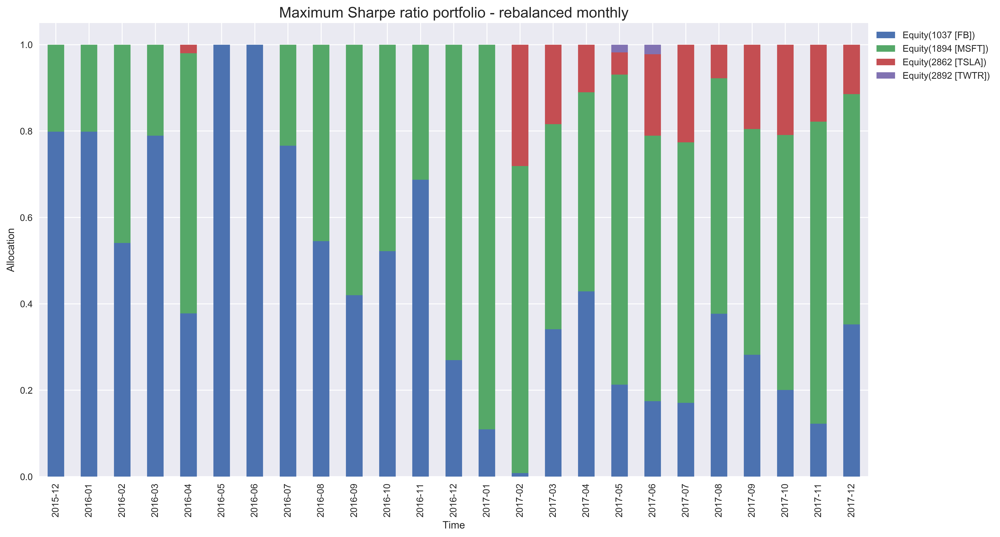

In [21]:
# extract non-empty weights
filtered_weights = max_sharpe_monthly_df.loc[max_sharpe_monthly_df['weights'].map(lambda d: len(d)) > 0, 'weights']

# convert index to datatime
new_index = pd.Series(pd.to_datetime(max_sharpe_monthly_df.weights.index).date).map(lambda x: x.strftime('%Y-%m'))
weights_df = pd.DataFrame.from_records(filtered_weights, index=new_index)

# select only the first value per month to remove duplicates
weights_df = weights_df.groupby(weights_df.index).head(1)

# plot the results
ax = weights_df.plot(kind='bar', stacked=True) 
ax.set(xlabel='Time', ylabel='Allocation')
ax.set_title('Maximum Sharpe ratio portfolio - rebalanced monthly', fontsize=16)
ax.legend(bbox_to_anchor=(1,1));

In [22]:
max_sharpe_monthly_perf = qf.get_performance_summary(returns)

# Minimum volatility portfolio - rebalancing every month

In [23]:
%%zipline --start 2015-12-31 --end 2017-12-31 --capital-base 50000.0 -o min_vol_month_start.pkl

# imports
from zipline.api import (symbols, record, order_target_percent, 
                         schedule_function, date_rules, time_rules)
from zipline.finance import commission
import numpy as np 
import pandas as pd
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

def initialize(context):
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.assets = symbols('TSLA', 'MSFT', 'FB', 'TWTR')
    context.n_assets = len(context.assets)
    context.window = 252
    
    schedule_function(rebalance,
                      date_rules.month_end(),
                      time_rules.market_close())

def rebalance(context, data):
    cleaned_weights = []
        
    # extract prices
    prices = data.history(context.assets, fields='price',
                          bar_count=context.window + 1, frequency='1d')

    # calculate expected returns and sample covariance amtrix
    avg_returns = expected_returns.mean_historical_return(prices)
    cov_mat = risk_models.sample_cov(prices)

    # get weights maximizing the Sharpe ratio
    ef = EfficientFrontier(avg_returns, cov_mat)
    weights = ef.min_volatility()
    cleaned_weights = ef.clean_weights()
    
    # submit orders
    for asset in context.assets:
        order_target_percent(asset, cleaned_weights[asset])
    
    record(weights=cleaned_weights)

,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return,weights
2015-12-31 21:00:00+00:00,NaN,0.000000,None,0.0,NaN,None,0.00000,50000.00000,0.000,0.000,...,0.0,0,NaN,50000.00000,0.000,0.000,1,[],0.0,"{Equity(2892 [TWTR]): 0.09557, Equity(1894 [MS..."
2016-01-04 21:00:00+00:00,0.005463,-0.000487,None,0.0,0.0,None,-48695.33550,1304.66450,48671.000,48671.000,...,0.0,0,-11.224972,50000.00000,0.000,0.000,2,[{'order_id': '0820fd1c2150426c985d761767a7691...,0.0,"{Equity(2892 [TWTR]): 0.09557, Equity(1894 [MS..."
2016-01-05 21:00:00+00:00,0.013918,0.000728,None,0.0,0.0,None,0.00000,1304.66450,48731.750,48731.750,...,0.0,0,13.725443,1304.66450,48671.000,48671.000,3,[],0.0,"{Equity(2892 [TWTR]): 0.09557, Equity(1894 [MS..."
2016-01-06 21:00:00+00:00,0.073980,-0.008245,None,0.0,0.0,None,0.00000,1304.66450,48283.070,48283.070,...,0.0,0,-7.281362,1304.66450,48731.750,48731.750,4,[],0.0,"{Equity(2892 [TWTR]): 0.09557, Equity(1894 [MS..."
2016-01-07 21:00:00+00:00,0.280594,-0.048451,None,0.0,0.0,None,0.00000,1304.66450,46272.800,46272.800,...,0.0,0,-8.339798,1304.66450,48283.070,48283.070,5,[],0.0,"{Equity(2892 [TWTR]): 0.09557, Equity(1894 [MS..."
2016-01-08 21:00:00+00:00,0.253117,-0.052905,None,0.0,0.0,None,0.00000,1304.66450,46050.090,46050.090,...,0.0,0,-8.291240,1304.66450,46272.800,46272.800,6,[],0.0,"{Equity(2892 [TWTR]): 0.09557, Equity(1894 [MS..."
2016-01-11 21:00:00+00:00,0.234770,-0.054784,None,0.0,0.0,None,0.00000,1304.66450,45956.130,45956.130,...,0.0,0,-7.952145,1304.66450,46050.090,46050.090,7,[],0.0,"{Equity(2892 [TWTR]): 0.09557, Equity(1894 [MS..."
2016-01-12 21:00:00+00:00,0.246093,-0.042835,None,0.0,0.0,None,0.00000,1304.66450,46553.610,46553.610,...,0.0,0,-5.742402,1304.66450,45956.130,45956.130,8,[],0.0,"{Equity(2892 [TWTR]): 0.09557, Equity(1894 [MS..."
2016-01-13 21:00:00+00:00,0.274105,-0.074872,None,0.0,0.0,None,0.00000,1304.66450,44951.740,44951.740,...,0.0,0,-7.533247,1304.66450,46553.610,46553.610,9,[],0.0,"{Equity(2892 [TWTR]): 0.09557, Equity(1894 [MS..."
2016-01-14 21:00:00+00:00,0.316180,-0.049141,None,0.0,0.0,None,0.00000,1304.66450,46238.290,46238.290,...,0.0,0,-4.540551,1304.66450,44951.740,44951.740,10,[],0.0,"{Equity(2892 [TWTR]): 0.09557, Equity(1894 [MS..."


In [24]:
min_vol_month_start_df = pd.read_pickle('min_vol_month_start.pkl')
returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(min_vol_month_start_df)

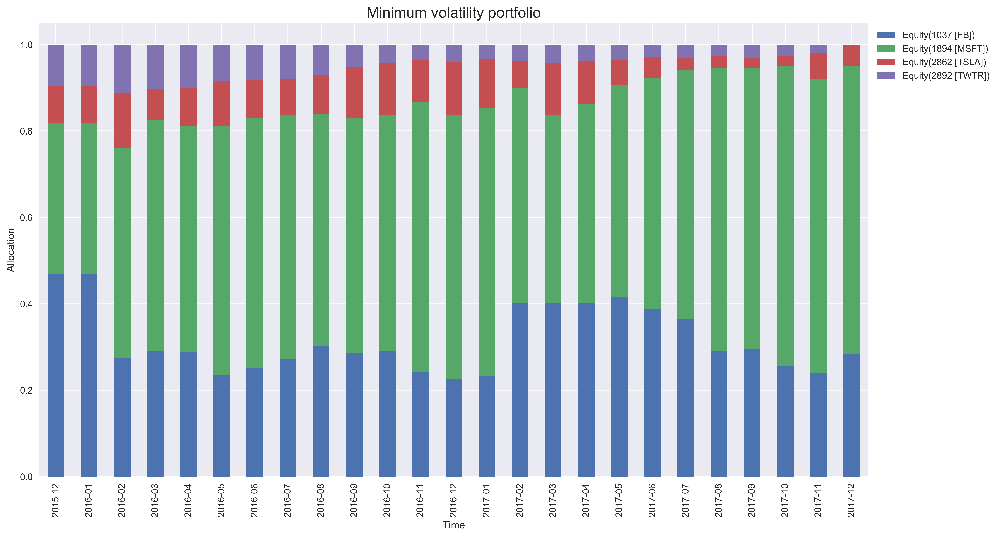

In [25]:

# extract non-empty weights
filtered_weights = min_vol_month_start_df.loc[min_vol_month_start_df['weights'].map(lambda d: len(d)) > 0, 'weights']

# convert index to datatime
new_index = pd.Series(pd.to_datetime(min_vol_month_start_df.weights.index).date).map(lambda x: x.strftime('%Y-%m'))
weights_df = pd.DataFrame.from_records(filtered_weights, index=new_index)

# select only the first value per month to remove duplicates
weights_df = weights_df.groupby(weights_df.index).head(1)

# plot the results
ax = weights_df.plot(kind='bar', stacked=True) 
ax.set(xlabel='Time', ylabel='Allocation')
ax.set_title('Minimum volatility portfolio', fontsize=16)
ax.legend(bbox_to_anchor=(1,1));

In [26]:
min_vol_month_perf = qf.get_performance_summary(returns)

# Comparing the performance

In [27]:
perf_df = pd.DataFrame({'1/n portfolio': benchmark_perf,
                        'Max Sharpe - 30 days rebalancing': max_sharpe_30_days_perf,
                        'Max Sharpe - monthly rebalancing': max_sharpe_monthly_perf,
                        'Min Volatility - monthly rebalancing': min_vol_month_perf})
perf_df.transpose()

,annual_volatility,annualized_returns,cumulative_returns,max_drawdown,sharpe_ratio,sortino_ratio
1/n portfolio,0.202332,0.192332,0.421656,-0.197996,0.971176,1.334315
Max Sharpe - 30 days rebalancing,0.202332,0.192332,0.421656,-0.197996,0.971176,1.334315
Max Sharpe - monthly rebalancing,0.197705,0.224845,0.500245,-0.122510,1.123783,1.744523
Min Volatility - monthly rebalancing,0.183540,0.294290,0.675187,-0.138981,1.497601,2.240891
